<a href="https://colab.research.google.com/github/lawesworks/vision-model-workbench/blob/main/YOLO_OD_Trainer_Hands_On.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi -q
!nvidia-smi

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# CONFIGURATION

# You shouldn't need to change anything other than the roboflow URL and the sample image URL
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Roboflow Project Settings
Roboflow_Project_URL = "https://universe.roboflow.com/gun-7mokr/gun-detection-2viw4"
Roboflow_Dataset_Version = 1

# User Provided Sample / Test Image
CONFIG_SAMPLE_IMAGE_URL = "https://images.pexels.com/photos/7714976/pexels-photo-7714976.jpeg"

# URL Regex
import re
Roboflow_URL_Regex_Pattern = r"roboflow\.com/([^/]+)/([^/?#]+)"
match = re.search(Roboflow_URL_Regex_Pattern, Roboflow_Project_URL)

#-------------------------------------------------------------------------------

# YOLO Model Config
YOLO_Model_Version = "yolov8"
YOLO_Model_Size = "n"

# Training Hyper-parameter Configs
Config_Epochs = 20
Config_Image_Size = 640
Config_Batch_Size = 16

#-------------------------------------------------------------------------------
# Auto-Derived Parameters
if match:
    Roboflow_Project_Workspace = match.group(1)
    Roboflow_Project_Slug = match.group(2)
else:
    print("Roboflow URL format not recognized")
    Roboflow_Project_Workspace = ""
    Roboflow_Project_Slug = ""

Roboflow_Project_Name = ""
Roboflow_Project_Folder = ""
LATEST_PREDICT_DIR = "runs/detect/predict"
LATEST_TRAIN_DIR   = "runs/detect/train"

#-------------------------------------------------------------------------------

print(f"""
===== Training Configuration =====

Project URL      : {Roboflow_Project_URL}
Workspace        : {Roboflow_Project_Workspace}
Project Slug     : {Roboflow_Project_Slug}
Dataset Version  : {Roboflow_Dataset_Version}

Project Name     : {Roboflow_Project_Name}
Project Folder   : {Roboflow_Project_Folder}


Model            : {YOLO_Model_Version}
Model Size       : {YOLO_Model_Size}
Epochs           : {Config_Epochs}
Image Size       : {Config_Image_Size}
Batch Size       : {Config_Batch_Size}

==================================
""")


===== Training Configuration =====

Project URL      : https://universe.roboflow.com/gun-7mokr/gun-detection-2viw4
Workspace        : gun-7mokr
Project Slug     : gun-detection-2viw4
Dataset Version  : 1

Project Name     : 
Project Folder   : 


Model            : yolov8
Model Size       : n
Epochs           : 20
Image Size       : 640
Batch Size       : 16




In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Load Roboflow API Key

# Retrieves the Roboflow API key that you've set in Google Colab's Secrets
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

from google.colab import userdata
api_key = userdata.get('ROBOFLOW_API_KEY')

if api_key is None:
    raise ValueError("ROBOFLOW_API_KEY not found. Check Colab Secrets.")

print("Roboflow API Key Found")

Roboflow API Key Found


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Load Libraries

# These are commonly used libraries that we will use in this script
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

from IPython.display import Image, display
import glob
import os

print(f"""
======= Imported Libraries =======

Ipython.display  : Image
Ipython.display  : display
glob
os

==================================
""")


======= Imported Libraries =======

Ipython.display  : Image
Ipython.display  : display
glob
os




In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Install Ultralytics

# Ultralytics is necessary because it provides the YOLO framework and APIs required to load the .pt model and run object detection inference in Python.
# This .pt file (weights file) is what we will use in our inference scripts
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

print("Installing Ultralytics (Please wait)\n")

!pip install -q roboflow ultralytics

print("\nCompleted Ultralytics Install")

Installing Ultralytics (Please wait)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 73.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 83.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 139.2 MB/s eta 0:00:00

Completed Ultralytics Install


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Load Libraries

# Commonly used libraries we will use in this project
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

import math
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import Image as DisplayImage, display
import torch
import glob
import os

print(f"""
===== Imported Libraries =====

Ipython.display  : Image
Ipython.display  : DisplayImage
matplotlib       : plt
torch
math
glob
os

==================================
""")


===== Imported Libraries =====

Ipython.display  : Image
Ipython.display  : DisplayImage
matplotlib       : plt
torch
math
glob
os




In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# HELPER FUNCTIONS

# Reusable functions used in this script to automate repetitive or iterative steps / more to come
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++



# function to create image grid (Left → Right, Row Wrap) of images saved into the Predicted Folder
# ----------------------------------------------------------------------------------------------------
def show_image_grid_paged(image_paths, cols=5, per_page=20, page=1, figsize_per_cell=3):
    """
    Display images in a true grid, paged.
    - cols: images per row
    - per_page: total images per page
    - page: 1-based page index
    - figsize_per_cell: size multiplier per grid cell
    """

    if not image_paths:
        print("No images to display.")
        return

    start = (page - 1) * per_page
    end = min(start + per_page, len(image_paths))
    page_paths = image_paths[start:end]

    rows = math.ceil(len(page_paths) / cols)
    fig_w = cols * figsize_per_cell
    fig_h = rows * figsize_per_cell

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))
    axes = axes.flatten() if isinstance(axes, (list, tuple)) is False else axes

    # If only one subplot, axes may not be iterable the same way
    try:
        axes = axes.flatten()
    except Exception:
        axes = [axes]

    for ax in axes:
        ax.axis("off")

    for ax, img_path in zip(axes, page_paths):
        img = Image.open(img_path).convert("RGB")
        ax.imshow(img)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    print(f"Showing images {start+1}–{end} of {len(image_paths)} (page {page})")



# function to count images in given folder
# ----------------------------------------------------------------------------------------------------
def count_images(folder):
    extensions = ("*.jpg", "*.jpeg", "*.png")
    count = 0
    for ext in extensions:
        count += len(glob.glob(os.path.join(folder, ext)))
    return count



# function to get latest training path DIR
# ----------------------------------------------------------------------------------------------------
def get_latest_training_path():
    training_dirs = sorted(
        glob.glob("/content/runs/detect/train*"),
        key=os.path.getmtime
    )

    if not training_dirs:
        raise FileNotFoundError("No YOLO training runs found in runs/detect/")

    train_dir = training_dirs[-1]
    print(f"\nUsing training run from: {train_dir}")
    return train_dir


# function to get latest prediction path DIR
# ----------------------------------------------------------------------------------------------------
def get_latest_prediction_path():
  predict_dirs = sorted(
    glob.glob("runs/detect/predict*"),
    key=os.path.getmtime
  )

  PREDICT_DIR = predict_dirs[-1]
  print(f"\n\nUsing predictions from: {PREDICT_DIR}")
  return PREDICT_DIR


# function to get latest model best.pt path
# ----------------------------------------------------------------------------------------------------
def get_latest_pt_path(latest_train_path):
  pt_files = glob.glob(f"{latest_train_path}/weights/best.pt", recursive=True)

  if not pt_files:
      raise FileNotFoundError("No best.pt file found")

  return pt_files[0]


# function to get list of predicted / inferenced images
# ----------------------------------------------------------------------------------------------------
def get_inferenced_images(predict_dir):
  image_paths = glob.glob(os.path.join(predict_dir, "*.jpg")) + \
              glob.glob(os.path.join(predict_dir, "*.png"))

  return sorted(image_paths)


print(f"""
===== Loaded Helper Functions =====

show_image_grid_paged              :
count_images                       :
get_latest_training_path           :
get_latest_prediction_path         :
get_latest_pt_path                 :
get_inferenced_images              :

==================================
""")


===== Loaded Helper Functions =====

show_image_grid_paged              :
count_images                       :
get_latest_training_path           :
get_latest_prediction_path         :
get_latest_pt_path                 :
get_inferenced_images              :




In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Import the Dataset

# Leveraging Roboflow (or even HuggingFace) enables ready-to-use, versioned annotated datasets; This
# simplifies dataset management, preprocessing, and creating reproducible training workflows
# - all without having to staore or manage the data locally
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

print(f"Importing Dataset: [{Roboflow_Project_Slug}, Version: [{Roboflow_Dataset_Version}] from: [{Roboflow_Project_Workspace}] (Please wait)\n")

from roboflow import Roboflow


rf = Roboflow(api_key=api_key )
project = rf.workspace(Roboflow_Project_Workspace).project(Roboflow_Project_Slug)

dataset = project.version(Roboflow_Dataset_Version).download(YOLO_Model_Version)  # adjust version if needed

# Store Official Project Name and Folder location to Local Variables
Roboflow_Project_Name = project.name
Roboflow_Project_Folder = dataset.location

print(f"\nCompleted Dataset Import: {Roboflow_Project_Name}")

# Get Image Count within Training and Validation folders
Data_Train_Count = count_images(os.path.join(Roboflow_Project_Folder, "train", "images"))
Data_Valid_Count = count_images(os.path.join(Roboflow_Project_Folder, "valid", "images"))


print(f"""
===== Training Data Statistics =====

Roboflow Project Name              : {Roboflow_Project_Name}
Roboflow Project Folder            : {Roboflow_Project_Folder}
Training Image Count               : {Data_Train_Count}
Validation Image Count             : {Data_Valid_Count}

====================================
""")

Importing Dataset: [gun-detection-2viw4, Version: [1] from: [gun-7mokr] (Please wait)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to gun-detection-1 in yolov8:: 100%|██████████| 5202/5202 [00:02<00:00, 1866.82it/s]

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

Completed Dataset Import: gun detection

===== Training Data Statistics =====

Roboflow Project Name              : gun detection
Roboflow Project Folder            : /content/gun-detection-1
Training Image Count               : 2394
Validation Image Count             : 104




In [ ]:

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Get location of the yaml file for this project

# The YAML file defines the dataset configuration for training, including paths to the training/validation
# data and the list of class names, so the YOLO training script knows where the images and labels are
# and how to map class IDs to object categories.
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

yaml_files = glob.glob(f"{Roboflow_Project_Folder}/data.yaml", recursive=True)

if not yaml_files:
    raise FileNotFoundError("No data.yaml file found")

DATA_YAML_PATH = yaml_files[0]

print(f"Using dataset config: {DATA_YAML_PATH}")

Using dataset config: /content/gun-detection-1/data.yaml


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Train model on the data
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


print("Training The Model (Please wait)\n")
print(f"""
===== Training Hyper-parameters =====

Model            : {YOLO_Model_Version}
Model Size       : {YOLO_Model_Size}
Epochs           : {Config_Epochs}
Image Size       : {Config_Image_Size}
Batch Size       : {Config_Batch_Size}
Train Count      : {Data_Train_Count}
Valid Count      : {Data_Valid_Count}

=====================================
""")


from ultralytics import YOLO

DATA_YAML_PATH = DATA_YAML_PATH

model = YOLO("yolov8n.pt")  # small + fast starter model
results = model.train(
    data=DATA_YAML_PATH,
    epochs=Config_Epochs,
    imgsz=Config_Image_Size,
    batch=Config_Batch_Size
)

# get latest training folder - save it to variabble
LATEST_TRAIN_DIR = get_latest_training_path()


Training The Model (Please wait)


===== Training Hyper-parameters =====

Model            : yolov8
Model Size       : n
Epochs           : 20
Image Size       : 640
Batch Size       : 16
Train Count      : 2394
Valid Count      : 104


Ultralytics 8.4.27 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/gun-detection-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, 

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Get location of the latest weights generated after training
# The .pt weights file stores the trained YOLO model parameters learned during training, allowing the
# model to perform inference or continue training without retraining from scratch.
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

MODEL_PT_PATH = get_latest_pt_path(LATEST_TRAIN_DIR)

print(f"Using PT File: {MODEL_PT_PATH}")

Using PT File: /content/runs/detect/train/weights/best.pt


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Run the model against the test data in your project
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

best_model_path = glob.glob(MODEL_PT_PATH)[-1]
model = YOLO(best_model_path)

model.predict(source = Roboflow_Project_Folder + "/test/images", save=True, conf=0.25)

LATEST_PREDICT_DIR = get_latest_prediction_path()


image 1/97 /content/gun-detection-1/test/images/mgd_custom_frame1159_jpg.rf.1668d2570e9cd5a7ae774c23e5deed85.jpg: 640x640 1 -, 1 osd_gun - v3 2022-10-07 3-21pm, 8.4ms
image 2/97 /content/gun-detection-1/test/images/mgd_custom_frame1180_jpg.rf.eaf45dbe4a4121073b2ee9073b8fd81c.jpg: 640x640 2 -s, 1 osd_gun - v3 2022-10-07 3-21pm, 7.2ms
image 3/97 /content/gun-detection-1/test/images/mgd_custom_frame1546_jpg.rf.85c16baf0111b28419869215ad19795b.jpg: 640x640 1 -, 1 osd_gun - v3 2022-10-07 3-21pm, 7.2ms
image 4/97 /content/gun-detection-1/test/images/mgd_custom_frame17_jpg.rf.49c0b04044d6e67dea25d9dabce57e34.jpg: 640x640 2 -s, 1 osd_gun - v3 2022-10-07 3-21pm, 7.2ms
image 5/97 /content/gun-detection-1/test/images/mgd_custom_frame182_jpg.rf.19fb906d5b8e5c27b25b2519bfd606a1.jpg: 640x640 2 -s, 1 osd_gun - v3 2022-10-07 3-21pm, 7.2ms
image 6/97 /content/gun-detection-1/test/images/mgd_custom_frame1908_jpg.rf.579eadd883b7f3fe9ff2372c11d639b3.jpg: 640x640 1 -, 1 osd_gun - v3 2022-10-07 3-21pm, 7.2

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Get list of latest predicted / inferenced images
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

image_paths = get_inferenced_images(LATEST_PREDICT_DIR)

print(f"Found {len(image_paths)} predicted images")

Found 97 predicted images


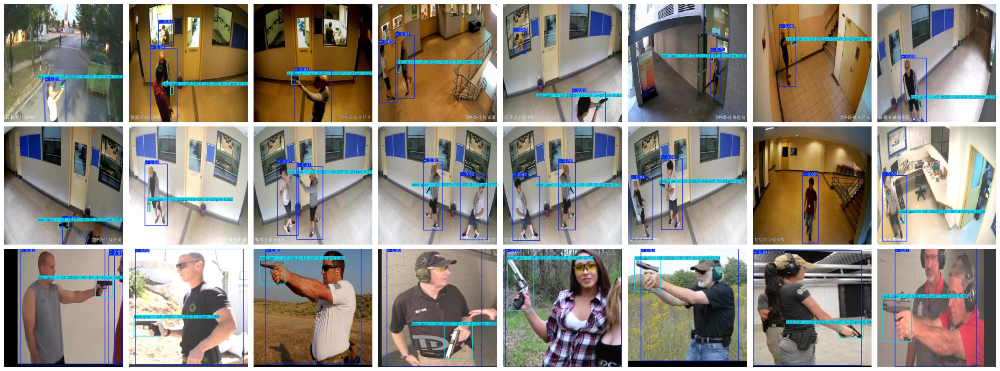

Showing images 1–24 of 97 (page 1)


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Show images in the Recent Predictions Folder
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

#show first 20 images, 5 per row
show_image_grid_paged(image_paths, cols=8, per_page=24, page=1)

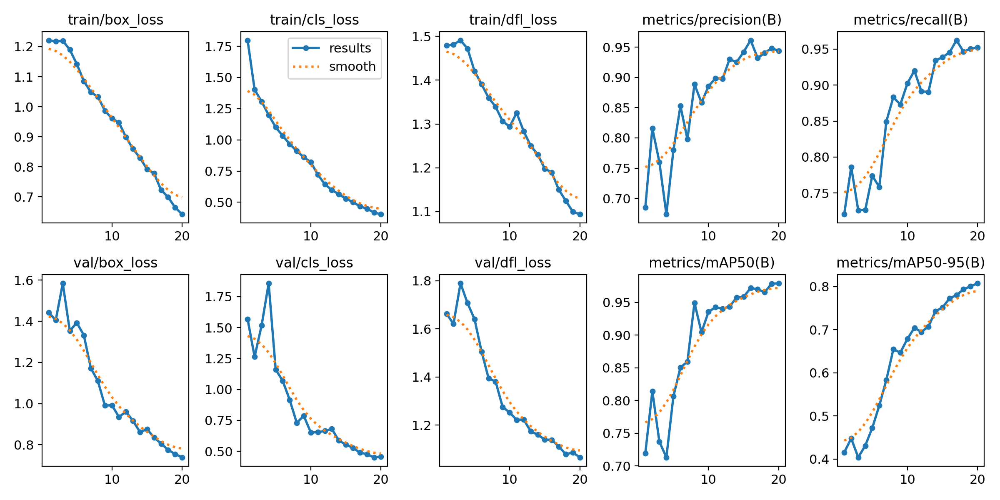

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# View the training plots (Loss Function plots / Accuracy)
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

DisplayImage(filename=f'/{LATEST_TRAIN_DIR}/results.png', width=600)

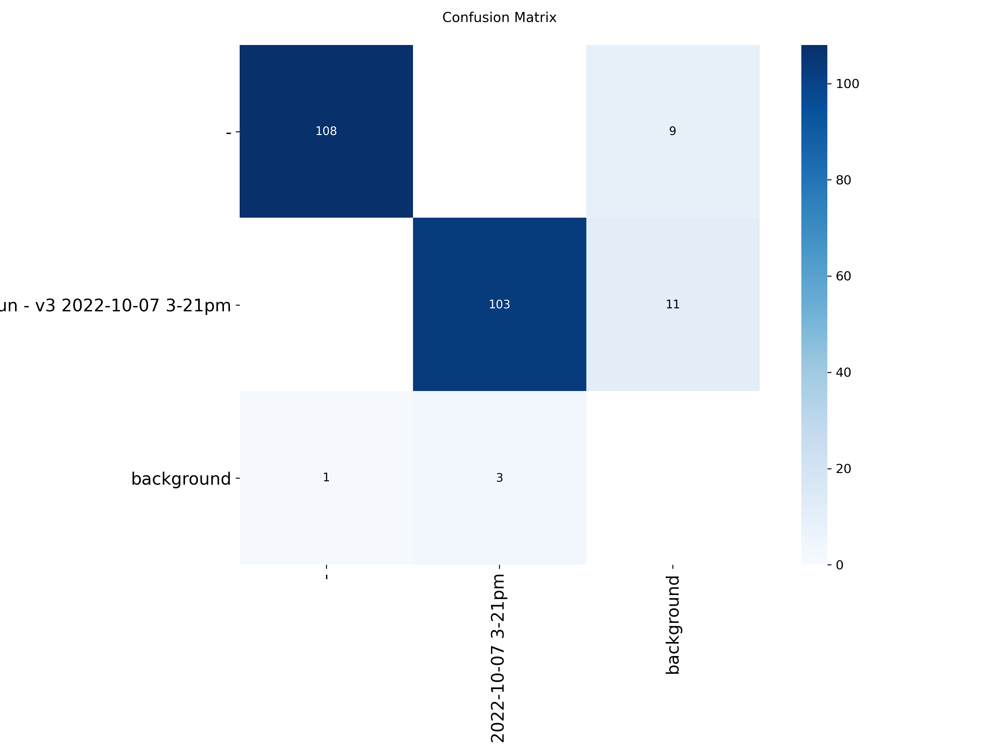

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# View the Confusio Matrix
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

DisplayImage(filename=f'/{LATEST_TRAIN_DIR}/confusion_matrix.png', width=600)

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# View training metrics
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# model.val(data=DATA_YAML_PATH) # dumps everything (verbose)

metrics = model.val(data=DATA_YAML_PATH)

print("mAP@0.5      :", metrics.box.map50)
print("mAP@0.5:0.95 :", metrics.box.map)
print("Precision    :", metrics.box.mp)
print("Recall       :", metrics.box.mr)


Ultralytics 8.4.27 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 780.1±236.9 MB/s, size: 29.4 KB)
val: Scanning /content/gun-detection-1/valid/labels.cache... 104 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 104/104 31.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.3it/s 3.0s
                   all        104        215      0.944      0.952      0.979      0.807
                     -         96        109      0.936      0.991      0.986      0.886
osd_gun - v3 2022-10-07 3-21pm        104        106      0.951      0.913      0.973      0.728
Speed: 4.4ms preprocess, 6.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/runs/detect/val
mAP@0.5      : 0.9793883853256382
mAP@0.5:0.95 : 0.807468287833181
Precision    : 0.9436441919220324
Recall       : 0.9520542358007423


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Run inference on an arbitrary image and save it to the content folder

# I’ve provided a URL to an image, but you can just as easily upload the source file to the Colab contents
# folder and use it as the input.
#
# For video input, the file should be uploaded to the contents folder as well (for obvious size and access
# reasons). The template for doing this is shown below, and a full example is demonstrated in the video
# example that follows.

# model.predict(source=f"/content/{SAMPLE_IMAGE}", save=True, conf=0.25)
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

CONFIG_SAMPLE_IMAGE_URL = "https://ufpro.com/storage/app/media/Blog/Rifle%20Fundamentals%20Ep9/thumb/560x415.crop/Header.jpg"

model.predict(
    source = CONFIG_SAMPLE_IMAGE_URL,
    save=True,
    conf=0.1,
    name=f"content",
    exist_ok=True
)



WARNING ⚠️ Download failure, retrying 1/3 https://ufpro.com/storage/app/media/Blog/Rifle Fundamentals Ep9/thumb/560x415.crop/Header.jpg... HTTP Error 403: Forbidden
image 1/1 /content/Header.jpg: 480x640 1 -, 1 osd_gun - v3 2022-10-07 3-21pm, 42.4ms
Speed: 3.7ms preprocess, 42.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/content


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: '-', 1: 'osd_gun - v3 2022-10-07 3-21pm'}
 obb: None
 orig_img: array([[[129, 152, 178],
         [125, 149, 173],
         [122, 144, 169],
         ...,
         [ 75,  79,  90],
         [ 78,  80,  91],
         [ 80,  82,  92]],
 
        [[128, 151, 177],
         [123, 147, 171],
         [119, 142, 164],
         ...,
         [ 64,  68,  79],
         [ 69,  71,  81],
         [ 72,  74,  84]],
 
        [[134, 158, 182],
         [129, 153, 177],
         [124, 147, 169],
         ...,
         [ 56,  62,  73],
         [ 62,  67,  76],
         [ 65,  70,  79]],
 
        ...,
 
        [[106, 131, 147],
         [108, 133, 149],
         [111, 134, 150],
         ...,
         [111, 140, 167],
         [108, 137, 164],
         [111, 140, 167]],
 
        [[ 96, 121, 137],
         [ 96, 121, 137],
         [ 98, 121, 137],


Opening: /content/Header.jpg 



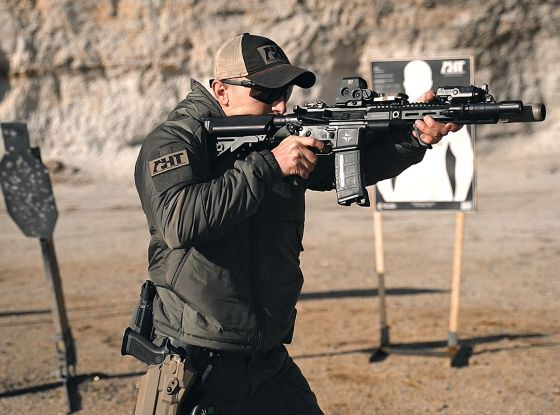

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# View a screenshot of the predicted annotated result
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# find the saved image (YOLO keeps original name or auto-generated one)
#predicted_images = glob.glob(os.path.join("/content/", "*.jpg"))

extensions = (".jpg", ".jpeg", ".png")

predicted_images = [
    os.path.join("/content/", f)
    for f in os.listdir("/content/")
    if f.lower().endswith(extensions)
]

# Sort by last modified time (oldest → newest)
predicted_images.sort(key=os.path.getmtime)
latest_image = predicted_images[-1]

print("Opening:", latest_image,"\n")

DisplayImage(
    filename=latest_image,
    width=600
)

In [ ]:
from google.colab import files

uploaded = files.upload()

uploadedvideofilename = list(uploaded.keys())[0]

Saving gun.mp4 to gun.mp4


In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Run inference on an uploaded video and save it to the content folder
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

input_video = "/content/" + uploadedvideofilename   # upload or mount from Drive
results = model.predict(source=input_video, save=True, conf=0.25, name=f"/content", exist_ok=True)


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/418) /content/gun.mp4: 384x640 1 -, 42.8ms
video 1/1 (frame 2/418) /content/gun.mp4: 384x640 1 -, 7.5ms
video 1/1 (frame 3/418) /content/gun.mp4: 384x640 2 -s, 1 osd_gun - v3 2022-10-07 3-21pm, 6.8ms
video 1/1 (frame 4/418) /content/gun.mp4: 384x640 1 -, 1 osd_gun - v3 2022-10-07 3-21pm, 6.5ms
video 1/1 (frame 5/418) /content/gun.mp4: 384x640 1 -, 8.1ms
video 1/1 (frame 6/418) /content/gun.mp4: 384x640 1 -, 7.7ms
video 1/1 (frame 7/418

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Install FFMPEG
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

!apt-get -qq install ffmpeg

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# Convert the the annotatd AVI into an MP4
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

!ffmpeg -i /content/gun.avi -vcodec libx264 -acodec aac /content/output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# View the the converted MP4 file in an HTML Viewer
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

from IPython.display import HTML
from base64 import b64encode

mp4 = open("/content/output.mp4",'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=640 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")